In [1]:
#import packages to do EDA
import pandas as pd
import numpy as np

import os
import gc

from sklearn.model_selection import train_test_split
from tqdm import tqdm

from lime.lime_tabular import LimeTabularExplainer
import joblib
import shap
import warnings
warnings.filterwarnings('ignore')
import pickle

In [2]:
with open('./data/train_vector.pkl', 'rb') as f:
    X = pickle.load(f)

with open('./data/feature_names.pkl', 'rb') as f:
    feature_names = pickle.load(f)

with open('./data/yvalues.pkl', 'rb') as f:
    y = pickle.load(f)

#### testing purpose only
traindata=50000
X = X.toarray()[:traindata,:]
y=y[:traindata]
print(X.shape,y.shape)

In [3]:
df_train = pd.DataFrAame(X.toarray(), columns =feature_names)

In [4]:
#split data only train and test. 
X_train, X_test, y_train, y_test = train_test_split(df_train, y, test_size=0.33, stratify=y,random_state=42)

In [5]:
#load LGBM trained model
filename='./results/model_lgb.pkl'
model = joblib.load(open(filename, 'rb'))

In [6]:
#Credit:https://www.analyticsvidhya.com/blog/2020/10/unveiling-the-black-box-model-using-explainable-ai-lime-shap-industry-use-case/
#credit:https://www.kdnuggets.com/2019/12/interpretability-part-3-lime-shap.html
class_names = [0, 1]
#instantiate the explanations for the data set
limeexplainer = LimeTabularExplainer(X_test.values, 
                                     class_names=class_names, 
                                     feature_names = X_test.columns,
                                     feature_selection="lasso_path",
                                     discretize_continuous = True,
                                     #discretizer="entropy",
                                    )
idx=0 # the rows of the dataset
explainable_exp = limeexplainer.explain_instance(X_test.values[idx], model.predict_proba, num_features=8, labels=class_names)
explainable_exp.show_in_notebook(show_table=True, show_all=False)

In [7]:
from lime import submodular_pick
sp_obj = submodular_pick.SubmodularPick(limeexplainer, X_test.values, model.predict_proba, 
                                        sample_size=500, num_features=10, num_exps_desired=5)

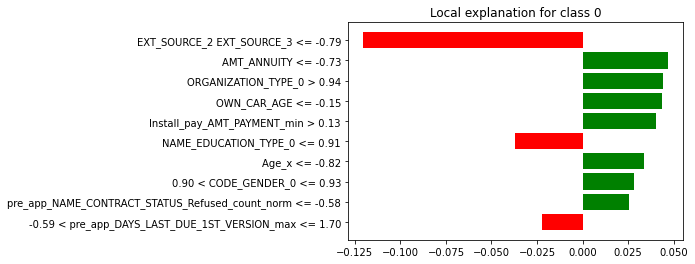

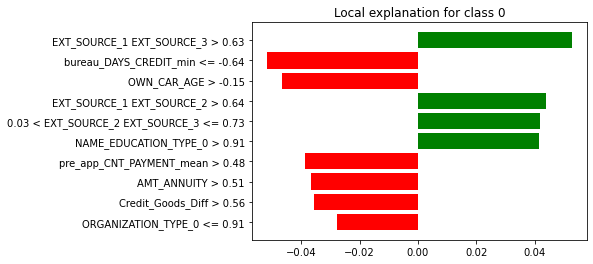

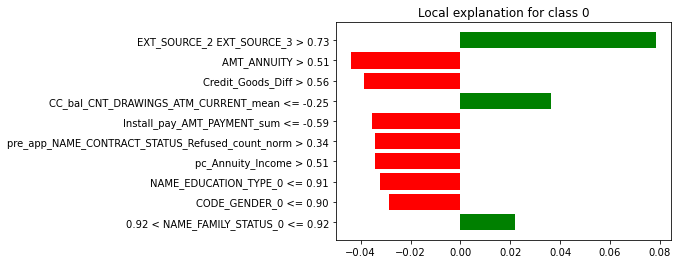

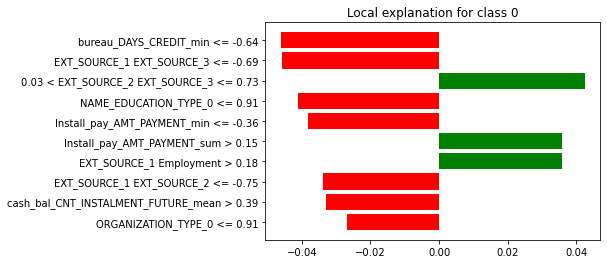

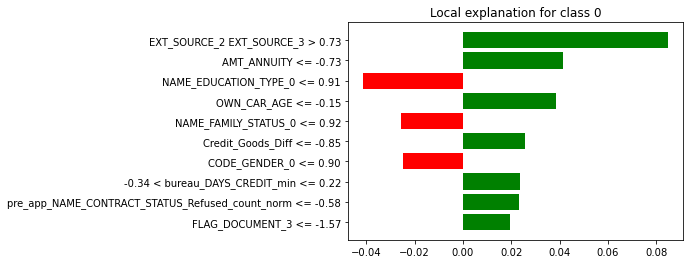

In [8]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

#Plot the 5 explanations
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_obj.sp_explanations];

# Make it into a dataframe
W_pick=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.sp_explanations]).fillna(0)
 
W_pick['prediction'] = [this.available_labels()[0] for this in sp_obj.sp_explanations]
 
#Making a dataframe of all the explanations of sampled points
W=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.explanations]).fillna(0)
W['prediction'] = [this.available_labels()[0] for this in sp_obj.explanations]
 
#Plotting the aggregate importances
np.abs(W.drop("prediction", axis=1)).mean(axis=0).sort_values(ascending=False).head(25).\
                                    sort_values(ascending=True).iplot(kind="barh")

#Aggregate importances split by classes
grped_coeff = W.groupby("prediction").mean()
 
grped_coeff = grped_coeff.T
grped_coeff["abs"] = np.abs(grped_coeff.iloc[:, 0])
grped_coeff.sort_values("abs", inplace=True, ascending=False)
grped_coeff.head(25).sort_values("abs", ascending=True).drop("abs", axis=1).iplot(
    kind="barh", bargap=0.5
)

In [9]:
explainer = shap.TreeExplainer(model)
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer Expected Value: {expected_value}")
idx = 100 # row selected for fast runtime
select = range(idx)
features = X_test.iloc[select]
feature_display = df_train.loc[features.index]
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Explainer Expected Value: [-0.68022446]


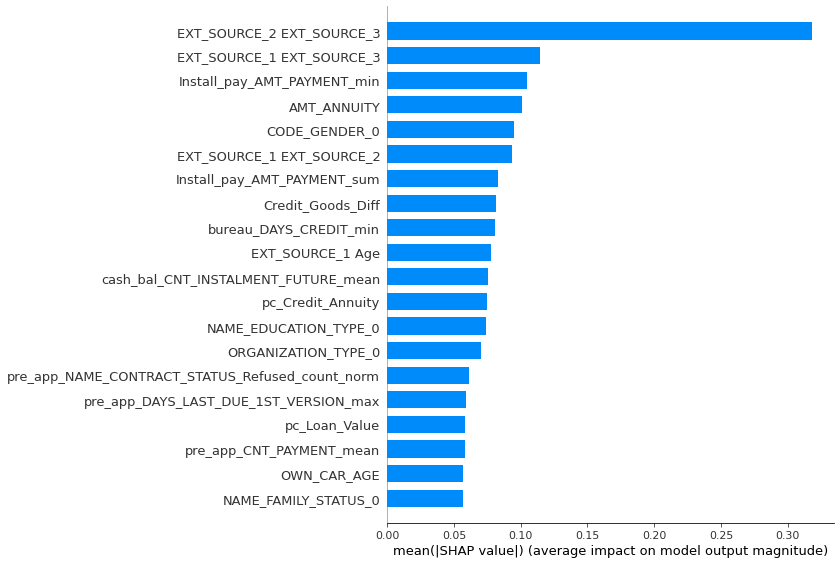

In [10]:
shap.summary_plot(shap_values,feature_display,plot_type='bar')

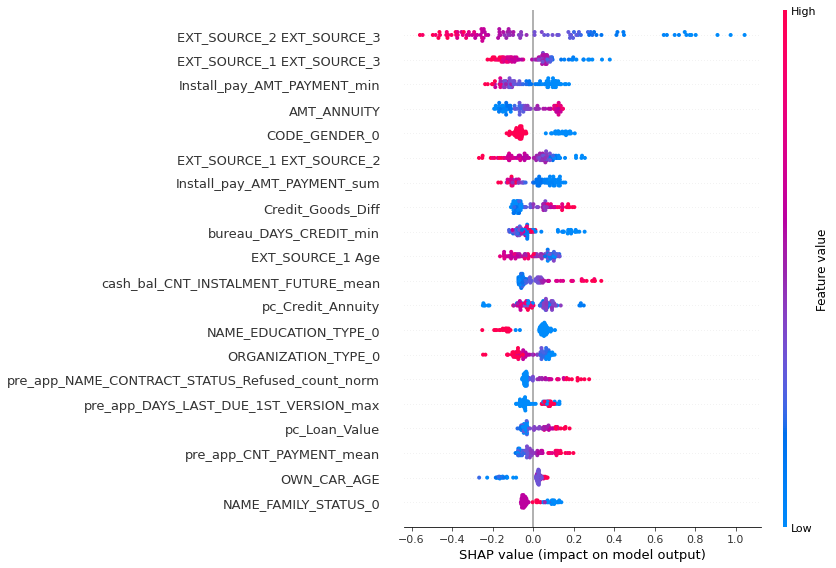

In [11]:
shap.summary_plot(shap_values, features)

In [12]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, feature_display)

In [13]:
shap.initjs() # run to show the plot
shap.force_plot(explainer.expected_value, shap_values=shap_values[0,:], features=feature_display.iloc[0,:])

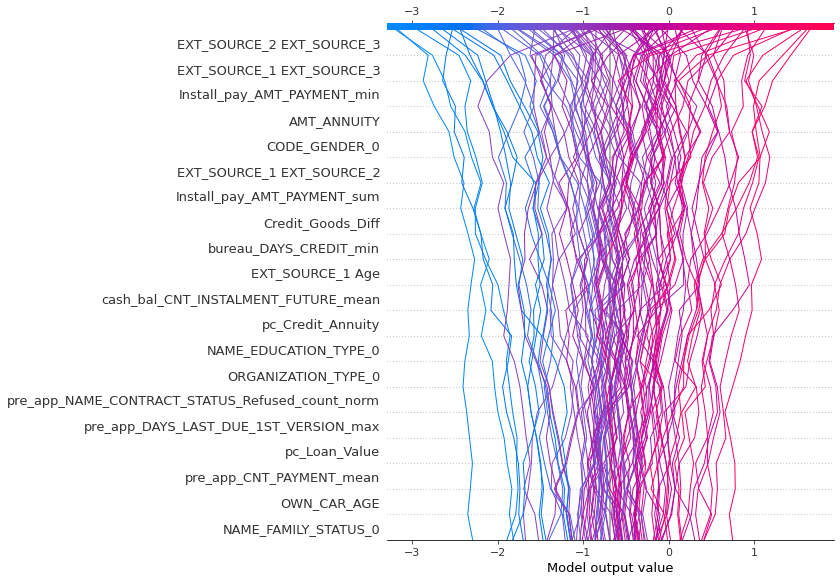

In [14]:
shap.decision_plot(expected_value, shap_values, features)

### Summary